# რეკომენდაციების სისტემა
---
* თამთა თოფურია: ttopu18@freeuni.edu.ge
* ალექსანდრე ხოხიაშვილი: alkhok18@freeuni.edu.ge

## ამოცანის აღწერა: 
ჩვენი მიზანია მოცემული მონაცემების მიხედვით შევთავაზოთ მომხმარებლებს ახალი საჭმელი.
შეთავაზებები იქნება პერსონალური თითოეული მომხარებლისთვის.

* პროექტის პირველ ნაწილში საჭმელს შევთავაზებთ გემოვნების მიხედვით. ანუ რამდენად მოეწონებოდა მომხარებელს ესა თუ ის საკვები. 
* პროექტის მეორე ნაწილში მომხმარებელს შევთავაზებთ საკვებს, რომელიც მაქსიმალურად იქნება მის მიზანთან(goal) შესაბამისობაში.
    * ვცდილობთ რომ მომხარებლებს შევთავაზოთ ისეთი საკვები რომელიც მათ დაეხმარება მათივე პერსონალური საკვები ღირებულებების მიზნების(nutritional goal) მიღწევაში. 
---
---

In [1]:
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import os
import json
import functools 
import random
from numba import jit
import re

%matplotlib inline

# მონაცემების წაკითხვა

In [2]:
data = pd.read_csv('mfp-diaries.tsv', names = ['ID', 'Data', 'Meals', 'Summary'], sep='\t')

In [3]:
# მარტო პირვლეი 1000 იუზერის დატა დავტოვოთ
# data = data[data.ID<1000]

In [4]:
data

,ID,Data,Meals,Summary
0,1,2014-09-14,"[{""meal"": ""MY food"", ""dishes"": [{""nutritions"":...","{""total"": [{""name"": ""Calories"", ""value"": 2924}..."
1,1,2014-09-15,"[{""meal"": ""MY food"", ""dishes"": [{""nutritions"":...","{""total"": [{""name"": ""Calories"", ""value"": 2430}..."
2,1,2014-09-16,"[{""meal"": ""MY food"", ""dishes"": [{""nutritions"":...","{""total"": [{""name"": ""Calories"", ""value"": 1862}..."
3,1,2014-09-17,"[{""meal"": ""MY food"", ""dishes"": [{""nutritions"":...","{""total"": [{""name"": ""Calories"", ""value"": 2251}..."
4,1,2014-09-18,"[{""meal"": ""MY food"", ""dishes"": [{""nutritions"":...","{""total"": [{""name"": ""Calories"", ""value"": 2001}..."
...,...,...,...,...
587182,9897,2015-03-02,"[{""meal"": ""Breakfast"", ""dishes"": [{""nutritions...","{""total"": [{""name"": ""Calories"", ""value"": 1979}..."
587183,9897,2015-03-03,"[{""meal"": ""Breakfast"", ""dishes"": [{""nutritions...","{""total"": [{""name"": ""Calories"", ""value"": 2141}..."
587184,9897,2015-03-04,"[{""meal"": ""Breakfast"", ""dishes"": [{""nutritions...","{""total"": [{""name"": ""Calories"", ""value"": 543},..."
587185,9897,2015-03-14,"[{""meal"": ""Breakfast"", ""dishes"": [{""nutritions...","{""total"": [{""name"": ""Calories"", ""value"": 2024}..."


### JSON-ის გაპარსვა

In [5]:
datajsoned = data.copy()

In [6]:
datajsoned['Meals'] = datajsoned['Meals'].apply(lambda x:json.loads(x))
datajsoned['Summary'] = datajsoned['Summary'].apply(lambda x:json.loads(x))

ვნახოთ როგორ გამოიყურება მონაცენები:

In [7]:
# Meals
datajsoned['Meals'][1000]

[{'meal': '10 AM - 2 PM',
  'dishes': [{'nutritions': [{'name': 'Calories', 'value': '5'},
     {'name': 'Carbs', 'value': '0'},
     {'name': 'Fiber', 'value': '0'},
     {'name': 'Sugar', 'value': '0'},
     {'name': 'Protein', 'value': '1'},
     {'name': 'Fat', 'value': '0'}],
    'name': 'Coffee - Brewed from grounds, 2 cup (8 fl oz)'},
   {'nutritions': [{'name': 'Calories', 'value': '100'},
     {'name': 'Carbs', 'value': '1'},
     {'name': 'Fiber', 'value': '0'},
     {'name': 'Sugar', 'value': '0'},
     {'name': 'Protein', 'value': '0'},
     {'name': 'Fat', 'value': '10'}],
    'name': 'Kroger - Heavy Whipping Cream, 2 Tbsp (15ml)'},
   {'nutritions': [{'name': 'Calories', 'value': '220'},
     {'name': 'Carbs', 'value': '0'},
     {'name': 'Fiber', 'value': '0'},
     {'name': 'Sugar', 'value': '0'},
     {'name': 'Protein', 'value': '14'},
     {'name': 'Fat', 'value': '18'}],
    'name': 'Cheddar Cheese, Sharp - Tillamook, 2 oz (28 grams)'},
   {'nutritions': [{'name': '

როგორც ვხედავთ, თითოეულ მომხმარებლებს დღის განმავლობაში შეჰყავდა ყველაფერი რასაც ჭამდა. თავისი კვებითი ღირებულებებით.

In [8]:
# Summary
datajsoned['Summary'][1000]

{'total': [{'name': 'Calories', 'value': 1590},
  {'name': 'Carbs', 'value': 44},
  {'name': 'Fiber', 'value': 14},
  {'name': 'Sugar', 'value': 19},
  {'name': 'Protein', 'value': 86},
  {'name': 'Fat', 'value': 122}],
 'goal': [{'name': 'Calories', 'value': 2150},
  {'name': 'Carbs', 'value': 54},
  {'name': 'Fiber', 'value': 25},
  {'name': 'Sugar', 'value': 25},
  {'name': 'Protein', 'value': 134},
  {'name': 'Fat', 'value': 155}]}

ასევე მოცემული გვაქვს ყოველდღიური goal-ები. ეს goal-ები კონკრეტულ იუზერზე არის მორგებული, ამიტომ მათი გამოყენება კარგი იქნებოდა.

რეკომენდაციის სიტემისთვის საჭიროა, რომ ყველა მომხმარებელი ერთსადაიმავე საჭმელს ერთნაირად წერდეს სისტემაში. სამწუხაროდ ჩვენი მონაცემები საკმაოდ დაბინძურებულია: საჭმელის დასახელების გარდა მომხმარებლებს შეყავდათ მაღაზიის სახელი, პორციის ზომა და სხვა უმნიშვნელო დეტალები.

თავდაპირევლად ვიფიქრეთ, რომ ამ მონაცემების გაპარსვას ხელით შევძლებდით თუკი მოცემული სტრინგების სრტუქტურას გავიაზრებდით და საბოლოოდ მხოლოდ საჭმლის სახელს დავტოვებდით.

---
# საჭმლის სახელების ხელით გაპარსვა

ამოვიწეროთ და დავაკვირდეთ სახელებს რათა მათი გაპარვა შევძლოთ

In [9]:
# json-იდან მხოლოდ სახელების დატოვება
def parse_names(meals):
    return list(map(lambda x: x['name'], functools.reduce(lambda x,y: x+y,  map(lambda x:x['dishes'], meals))))

In [10]:
names = datajsoned.copy()

In [11]:
# მარტო სახელები
names = names['Meals'].apply(parse_names)

In [12]:
names[0]

['my - McDonalds Espresso Pronto® Flat White, 2 TALL',
 'Quest Bar - Banana Nut Muffin Natural Protein Bar, 60 g',
 'Uncle Tobys Australia - Vita Brits, 3 Biscuits 33.3g',
 'Pauls - Smarter White Milk, 600 ml',
 'Quest Bar - Cookies and Cream, 1 bar',
 'Gu Sports - Chomps, 8 pieces',
 'Quest Bar - Banana Nut Muffin Natural Protein Bar, 60 g',
 'Quest - Protein Bar Chocolate Peanut Butter, 1 bar (60 g)',
 'Grilld - Simply Grilled (Real), 1.25 burger',
 'Grilld - Snack Chips, 1 snack size',
 'Tasti - Salted Caramel Protein Bar, 40 g']

In [13]:
# სულ რამდენი საჭმლის entry გვაქვს
functools.reduce(lambda x,y: x+y, map(lambda x:len(x), names))

6502747

ყველა სახელის ერთ მასივიში თავის მოყრა:

In [14]:
names = names.explode()
allnames = names.tolist()

In [15]:
len(allnames)

6502747

ვნახოთ რამდენი უნიკალური სახელი გვაქვს ყველანაირი გაპარსვის გარეშე:

In [16]:
len(set(allnames))

1461367

მონაცემების დაახლოებით მეოთხედი არის უნიკალური

In [17]:
random.shuffle(allnames)
allnames

["Wendy's - Med Coke, 20 oz",
 'Chicken Enchilada Soup, 1.5 serving(s)',
 'Kerrygold - Butter, 10 g',
 'Coffee - Brewed from grounds, 3 cup (8 fl oz)',
 'Drink - Lipton Green Tea, 1 tea bag',
 'Kraft - Miracle Whip, Calorie-wise, 15 mL (1 tbsp)',
 'Shady Brook Farms - Turkey - Boneless Breast Chops *, 2.6 oz.',
 'Cvs - Multivitamin, 1 tablet',
 'Blue Diamond - Almonds Whole Natural 43g -1 Pkg, 1 pkg (43g)',
 'Sodexo Healthcare - Greek Salad, 1 Salad',
 'Jhonsonville - Beddar With Cheddar Smoked Sausage & Cheddar Cheese, 1 link (66g)',
 'pistachios - pistachio, 1 package',
 'Babybel - (Light) Mini Cheese, 2 cheese',
 'Hershey - Caramel Sauce, 20.5 g',
 'Pizza Hut - Bbq Americano, 3 Slice',
 'Coriander (cilantro) leaves - Raw (Cilantro, raw, Chinese parsley, raw), 9 sprigs',
 'Kirkland Signature - Egg Whites - 100% Liquid Egg Whites, 161 g',
 'Mangos - Raw, 0.25 cup, sliced',
 'Eggs - Hard Boiled, 1 Egg',
 'Mts Nutrition Machine Whey - Peanut Butter Fluff Protein, 2 Scoop (36g)',
 'Apple

In [18]:
sorted(allnames)

['"100days" quiche (Pepper, Kale, Cheddar), 0.75 serving',
 '"100days" quiche (Pepper, Kale, Cheddar), 1 serving',
 '"100days" quiche (Pepper, Kale, Cheddar), 1 serving',
 '"Anti" Pasta Salad, 0.5 serving(s)',
 '"Anti" Pasta Salad, 0.5 serving(s)',
 '"Anti" Pasta Salad, 1 serving(s)',
 '"Better than Potatoes" Cheesy Cauliflower Puree (Low Carb) - I Breathe... I\'m Hungry..., 0.3 serving(s)',
 '"Better than Potatoes" Cheesy Cauliflower Puree (Low Carb) - I Breathe... I\'m Hungry..., 0.3 serving(s)',
 '"Better than Potatoes" Cheesy Cauliflower Puree (Low Carb) - I Breathe... I\'m Hungry..., 0.5 serving(s)',
 '"Buffalo Turkey" Salad, 1 serving(s)',
 '"Buffalo Turkey" Salad, 1 serving(s)',
 '"Cheesecake", 1 serving(s)',
 '"Cheesecake", 1 serving(s)',
 '"Cheesy" Paleo Chicken Casserole, 1 serving(s)',
 '"Cheesy" Paleo Chicken Casserole, 1 serving(s)',
 '"Cheesy" Paleo Chicken Casserole, 1 serving(s)',
 '"Company" salad , 1 serving(s)',
 '"Company" salad , 3 serving',
 '"Falafels", 1 serving

ამ მაგალითებზე დაკვირვებით ვხედავთ რომ მომხმარებლებს საჭმელი ხშირად შეყავთ შემდეგი სახით: 

`"მაღაზიის სახელი - საჭმელი, პორციის ზომა"`

ვცადოთ აქედან "საჭმელი"-ს ამოღება.

_რეალურად ამის გარდა სხვა ლოგიკების ვცადეთ თუმცა ყველაფრის აღწერას დიდი აზრი არ აქვს რადგან ამ მეთოდს საბოლოოდ შევეშვით._

In [19]:
# პორციის keywordები
badkw   =    [  "oz",  
                "cup", 
                "package",  
                "g", 
                "kg", 
                "serving", 
                "servings", 
                "small",  
                "big", 
                "-",
                "the", 
                "a",  
                "an", 
                "loaf", 
                "slice", 
                "size", 
                "regular", 
                "percent",
                "ml",
                "medium",
                "raw",
                  "british",
                  "large",
                  "packet"
              "quick", "minute", "easy",
              "with", "skin",
              "chopped",
              "only",
                  "0","1","2","3","4","5","6","7","8","9",
             ]

In [20]:
dollars = True
# ისტორიას შერჩეს:
def parse_food_name(name):
    orig = name
    name = name.lower()
    name = ','.join(name.split(',')[:-1]) # mdzimis moshoreba
    tiresplit = name.split('-')
    if len(tiresplit) == 1:
        name = tiresplit[0]
    else:
        name = '-'.join(tiresplit[1:])
        
    name = re.sub("[\(\[].*?[\)\]]", "", name)
    name = name.strip()
    
    splited = re.split('\W+', name)
    splited = [x for x in splited if x not in badkw]
    name = ' '.join(splited)
    name.strip()
    
    if len(name) == 0:
        name = tiresplit[0]
        splited = re.split('\W+', name)
        splited = [x for x in splited if x not in badkw]
        name = ' '.join(splited)
    name = name.strip()
    if dollars:
        return (name + ' $$$ ' + orig)
    else:
        return name
    #return (name.split(',')[-2].split('-')[1].strip().lower() + ' $$$ ' + name)

In [21]:
parsed = list(map(parse_food_name, allnames))

\$\$\$ - ის მარცხნივ ჩანს გაპარსული სახელი მარჯვნივ კი საწყისი

ვნახოთ რამდენად კარგად იმუშავა:

In [22]:
random.shuffle(parsed)
parsed

['vanilla flavored soy protein powder $$$ Trader Joes - Vanilla Flavored Soy Protein Powder, 2 scoops',
 'gluten free chocolate muffins $$$ Waitrose - Gluten Free Chocolate Muffins, 1 Muffin',
 'chocolate cakes $$$ Jenny Craig - Chocolate Cakes, 1 package',
 'roti gandum $$$ Sari Roti - Roti Gandum, 2 slices (73gr)',
 'crackers original $$$ Arnotts Savoy - Crackers - Original, 25 g',
 'whipped cream cheese spread $$$ Philadelphia - Whipped Cream Cheese Spread, 1.33 Tbsp (22g)',
 'chocolate chip cookies $$$ Homemade Cookies - Chocolate Chip Cookies, 2 Medium Cookie',
 'cuppa porridge golden syrup $$$ Quaker Oats So Simple - Cuppa Porridge - Golden Syrup, 55.7 g Sachet',
 'banana $$$ Fruit - Banana Medium, 1 Banana (118)g',
 'bananas $$$ Bananas - Raw, 0.5 medium (7" to 7-7/8" long)',
 'creamy peanut butter $$$ 365 Organic - Creamy Peanut Butter, 1 Tbsp / 32g',
 "reduced sugar concord grape jelly $$$ Welch's - Reduced Sugar Concord Grape Jelly, 1.5 tbsp",
 'banana $$$ Dole Food Company -

In [23]:
sorted(parsed)

[' $$$ #1, 1 serving(s)',
 ' $$$ #2, 1 serving(s)',
 ' $$$ #3, 1 serving(s)',
 ' $$$ , 8 serving(s)',
 ' $$$ 12\'in Subway Oven Roasted Chicken - ..., 3 " Sub',
 ' $$$ A, 1 serving',
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 0 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 0.5 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 1 Tortilla",
 " $$$ Aldi's Benita Flour Tortillas - *Large*, 2 Tortilla",
 ' $$$ Appel - *, 100 gr',
 ' $$$ Appel - *, 100 gr',
 ' $$$ Appel - *, 100 gr',
 ' $$$ Appel - *, 100 gr',
 ' $$$ Appel - *, 100 gr',
 ' $$$ Ap

ერთი შეხედვით ძალიან ცუდი შედეგბიც არ გვაქვს. თუმცა დასორტირებულად გამოტანისას ჩანს რომ ბევრი სტრინგი ცარიელ('') სახელიან საჭმელში გადაიყვანა.

In [24]:
dollars = False # ორიგინალი სახელი აღარ დატოვოს
parsed = list(map(parse_food_name, allnames))

In [25]:
from collections import Counter

In [26]:
counts = Counter(parsed)

In [27]:
counts.most_common()

[('brewed from grounds', 64333),
 ('banana', 50353),
 ('quick added calories', 38411),
 ('bananas', 36873),
 ('egg', 21588),
 ('spinach', 21444),
 ('strawberries', 18088),
 ('apples', 16995),
 ('milk', 15631),
 ('blueberries', 15623),
 ('hard boiled', 14685),
 ('carrots', 14394),
 ('peel', 14306),
 ('apple', 14252),
 ('almonds', 12673),
 ('fried', 12626),
 ('olive', 12328),
 ('coffee', 11633),
 ('avocado', 11595),
 ('salted', 11365),
 ('broccoli', 11111),
 ('half and half', 10785),
 ('reduced fat milkfat', 9894),
 ('butter', 9489),
 ('onions', 9083),
 ('mushrooms', 9002),
 ('bacon', 8831),
 ('creamy peanut butter', 8569),
 ('honey', 8299),
 ('whole', 7827),
 ('eggs', 7820),
 ('tomato', 7659),
 ('celery', 7492),
 ('breast meat cooked roasted', 7343),
 ('raspberries', 7219),
 ('french fries', 7183),
 ('nonfat', 7070),
 ('scrambled', 7038),
 ('peanut butter', 7008),
 ('cos or romaine', 6790),
 ('semi skimmed milk', 6699),
 ('grapes', 6426),
 ('egg whites', 6412),
 ('sour cream', 6184),
 (

აქ ვხედავთ ჩვენი პარსინგით ყველაზე ხშირად რა სახელები შეგვრჩა

brewed from grounds არის ყავა

ამ მეთოდს აქ შევეშვებით რადგან სხვა უკეთესი მოვიფიქრეთ. შედეგბს შევადარებთ მაინც. 

---

# გაპარვის მეორე მცდელობა

მთავარი იდეა: ___ვიყენებთ არსებულ საჭმელების სახელების დატასეტებს___

იმის ნაცვლად რომ სტრინგების სტრუქტურაში მოვძებნოთ საჭმლის სახელები ინტერნეტიდან ავიღოთ საჭმელების სახელების ბაზა და თითუეული საჭმელი მოვძებნოთ გვხდება თუ არა იუზერის შემოყვანილ სტრინგში. 


### საჭმელები სახელების ბაზები:
* https://foodb.ca/downloads
* https://corgis-edu.github.io/corgis/csv/food/

In [28]:
fooddb1 = pd.read_csv('foodb_2020_04_07_csv/Food.csv')
fooddb1

,id,name,name_scientific,description,itis_id,wikipedia_id,picture_file_name,picture_content_type,picture_file_size,picture_updated_at,...,food_type,created_at,updated_at,creator_id,updater_id,export_to_afcdb,category,ncbi_taxonomy_id,export_to_foodb,public_id
0,1,Angelica,Angelica keiskei,Angelica is a genus of about 60 species of tal...,NaN,Angelica,1.jpg,image/jpeg,111325.0,2012-04-20 09:29:57 UTC,...,Type 1,2011-02-09 00:37:14 UTC,2019-05-14 18:04:13 UTC,NaN,2.0,False,specific,357850.0,True,FOOD00001
1,2,Savoy cabbage,Brassica oleracea var. sabauda,Savoy cabbage (Brassica oleracea convar. capit...,NaN,Savoy cabbage,2.jpg,image/jpeg,155178.0,2012-04-20 09:39:54 UTC,...,Type 1,2011-02-09 00:37:15 UTC,2019-05-14 18:04:13 UTC,NaN,NaN,False,specific,1216010.0,True,FOOD00002
2,3,Silver linden,Tilia argentea,Tilia tomentosa (Silver Lime in the UK and Sil...,845789.0,Tilia tomentosa,3.jpg,image/jpeg,56367.0,2012-04-20 09:41:25 UTC,...,Type 1,2011-02-09 00:37:15 UTC,2019-05-17 16:19:45 UTC,NaN,NaN,False,specific,NaN,True,FOOD00003
3,4,Kiwi,Actinidia chinensis,"The kiwifruit, often shortened to kiwi in many...",506775.0,Kiwifruit,4.jpg,image/jpeg,110661.0,2012-04-20 09:32:21 UTC,...,Type 1,2011-02-09 00:37:15 UTC,2019-05-14 18:04:13 UTC,NaN,NaN,False,specific,3625.0,True,FOOD00004
4,5,Allium,Allium,Allium haematochiton is a species of wild onio...,42634.0,Allium haematochiton,5.jpg,image/jpeg,341911.0,2012-04-20 09:37:44 UTC,...,Type 1,2011-02-09 00:37:15 UTC,2019-05-14 18:04:13 UTC,NaN,NaN,False,specific,4678.0,True,FOOD00005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,1020,Cape gooseberry,Physalis peruviana,"Physalis peruviana, a plant species of the gen...",NaN,NaN,NaN,NaN,NaN,NaN,...,Type 1,2020-01-24 17:05:37 UTC,2020-01-24 17:05:37 UTC,NaN,NaN,False,NaN,NaN,True,FOOD00988
988,1021,Herbal tea,NaN,Herbal teas are the beverages made from the in...,NaN,NaN,NaN,NaN,NaN,NaN,...,Type 1,2020-03-12 20:55:17 UTC,2020-03-12 20:55:17 UTC,NaN,NaN,False,NaN,NaN,True,FOOD00989
989,1022,Fish oil,NaN,Fish oil is oil derived from the tissues of oi...,NaN,NaN,NaN,NaN,NaN,NaN,...,Type 1,2020-03-12 21:00:02 UTC,2020-03-12 21:00:02 UTC,NaN,NaN,False,NaN,NaN,True,FOOD00990
990,1023,Taco shell,NaN,The hard-shell or crispy taco is a tradition t...,NaN,NaN,NaN,NaN,NaN,NaN,...,Type 2,2020-03-12 21:01:58 UTC,2020-03-12 21:01:58 UTC,NaN,NaN,False,NaN,NaN,True,FOOD00991


In [29]:
food1 = fooddb1['name'].tolist()
food1

['Angelica',
 'Savoy cabbage',
 'Silver linden',
 'Kiwi',
 'Allium',
 'Garden onion',
 'Leek',
 'Garlic',
 'Chives',
 'Lemon verbena',
 'Cashew nut',
 'Pineapple',
 'Dill',
 'Custard apple',
 'Wild celery',
 'Peanut',
 'Burdock',
 'Horseradish',
 'Tarragon',
 'Mugwort',
 'Asparagus',
 'Oat',
 'Star fruit',
 'Brazil nut',
 'Common beet',
 'Borage',
 'Chinese mustard',
 'Swede',
 'Rape',
 'Common cabbage',
 'Cauliflower',
 'Brussel sprouts',
 'Kohlrabi',
 'Broccoli',
 'Chinese cabbage',
 'Turnip',
 'Pigeon pea',
 'Tea',
 'Capers',
 'Pepper',
 'Papaya',
 'Safflower',
 'Caraway',
 'Pecan nut',
 'Chestnut',
 'Roman camomile',
 'Chickpea',
 'Endive',
 'Chicory',
 'Chinese cinnamon',
 'Ceylon cinnamon',
 'Watermelon',
 'Lime',
 'Lemon',
 'Pummelo',
 'Mandarin orange (Clementine, Tangerine)',
 'Sweet orange',
 'Coffee',
 'Arabica coffee',
 'Robusta coffee',
 'Coriander',
 'Common hazelnut',
 'Saffron',
 'Muskmelon',
 'Cucumber',
 'Cucurbita',
 'Cumin',
 'Turmeric',
 'Quince',
 'Lemon grass',
 

In [30]:
# მეორე ბაზა
fooddb2 = pd.read_csv('food.csv')
fooddb2

,Category,Description,Nutrient Data Bank Number,Data.Alpha Carotene,Data.Ash,Data.Beta Carotene,Data.Beta Cryptoxanthin,Data.Carbohydrate,Data.Cholesterol,Data.Choline,...,Data.Major Minerals.Potassium,Data.Major Minerals.Sodium,Data.Major Minerals.Zinc,Data.Vitamins.Vitamin A - IU,Data.Vitamins.Vitamin A - RAE,Data.Vitamins.Vitamin B12,Data.Vitamins.Vitamin B6,Data.Vitamins.Vitamin C,Data.Vitamins.Vitamin E,Data.Vitamins.Vitamin K
0,BUTTER,"BUTTER,WITH SALT",1001,0,2.11,158,0,0.06,215,19,...,24,576,0.09,2499,684,0.17,0.003,0.0,2.32,7.0
1,BUTTER,"BUTTER,WHIPPED,WITH SALT",1002,0,2.11,158,0,0.06,219,19,...,26,827,0.05,2499,684,0.13,0.003,0.0,2.32,7.0
2,BUTTER OIL,"BUTTER OIL,ANHYDROUS",1003,0,0.00,193,0,0.00,256,22,...,5,2,0.01,3069,840,0.01,0.001,0.0,2.80,8.6
3,CHEESE,"CHEESE,BLUE",1004,0,5.11,74,0,2.34,75,15,...,256,1395,2.66,763,198,1.22,0.166,0.0,0.25,2.4
4,CHEESE,"CHEESE,BRICK",1005,0,3.18,76,0,2.79,94,15,...,136,560,2.60,1080,292,1.26,0.065,0.0,0.26,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,FROG LEGS,"FROG LEGS,RAW",80200,0,1.40,0,0,0.00,50,65,...,285,58,1.00,50,15,0.40,0.120,0.0,1.00,0.1
7409,MACKEREL,"MACKEREL,SALTED",83110,0,13.40,0,0,0.00,95,95,...,520,4450,1.10,157,47,12.00,0.410,0.0,2.38,7.8
7410,SCALLOP,"SCALLOP,(BAY&SEA),CKD,STMD",90240,0,3.06,0,0,0.00,53,81,...,476,265,3.00,100,30,1.30,0.100,0.0,1.50,0.2
7411,SNAIL,"SNAIL,RAW",90560,0,1.30,0,0,2.00,50,65,...,382,70,1.00,100,30,0.50,0.130,0.0,5.00,0.1


In [31]:
len(set(fooddb2['Category'].tolist()))

1183

In [32]:
food2 = list(set(fooddb2['Category'].tolist()))
food2

['TARO SHOOTS',
 'SOY FLR',
 'SILK PLUS FOR BONE HEALTH',
 'MACE',
 'PASSION-FRUIT JUC',
 'YARDLONG BNS',
 'LOBSTER',
 'LINGCOD',
 'SILK NOG',
 'WHIPPED CRM SUB',
 'WORTHINGTON CHILI',
 "JEW'S EAR",
 'JERUSALEM-ARTICHOKES',
 'SUNFLOWER SD FLR',
 'MORNINGSTAR FARMS CHEDDAR BURGER',
 'SCRAMBLED EGGS&SAUSAGE W/HASHED BROWN POTATOES',
 'INTERSTATE BRANDS CORP',
 'TURKEY ROLL',
 'GEORGE WESTON BAKER',
 'GELATIN DSSRT',
 'KEEBLER',
 'GREEN GIANT',
 'PEAS',
 'TOMATO SAU',
 'HORMEL RST BF HASH',
 'Cake',
 'SOURSOP',
 'CHEWING GUM',
 'CRANBERRIES',
 'AGUTUK',
 'APPLE JUC',
 'WATERMELON SD KRNLS',
 'FRZ NVL',
 'WHEAT FLOUR',
 'CRANBERRY',
 'EDAMAME',
 'MUSSEL',
 'CELERIAC',
 'WILD RICE',
 'FRUIT LEATHER',
 'WALNUTS',
 'TRAIL MIX',
 'FISH STICKS',
 'ARROWROOT',
 'CARP',
 'ROLLS',
 'Babyfood',
 'GROUPER',
 'FORM',
 'Buffalo',
 'SYRUPS',
 'CRLS',
 'ORANGE PEEL',
 'TORTILLA CHIPS',
 'CANDIES',
 'Elk',
 'Form Bar',
 'HUSH PUPPIES',
 'WORTHINGTON PROSAGE LINKS',
 'BETTY CROCKER',
 'SWEETENERS',
 'QUIN

In [33]:
foodToAdd = ['quick added calories',
             'tomato',
             'brie',
             'orange',
             'nutella',
             'vegetarian burgers',
             'sandwich',
             'french fries',
             'chips',
             'mozzarella',
             'baklava',
             'blueberry',
             'bell pepper',
             'browny',
             'brownie',
             'vitamins',
             'protein smoothie',
             'coca-cola',
             'green smoothie', 
             'smoothie', 
             'maple syrop',
             'lasagna', 
             'cabernet sauvignon',
             'coke'
             'baguette',
             'vinaigrette',
             'tequila',
             'lasagne',
             'meat',
             'granola', 
             'mayo', 
             'jalapeno',
             'blackfish',
            'tuna', 
            'cranberry', 
            'butterfish', 
            'lobster', 
            'pokeweed', 
            'shad',
            'cod',
            'croaker',
            'halibut',
            'herring',
            'mackerel',
            'menhaden',
            'pollock',
            'salmon',
            'wolffish',
            'beans', 
            'bamboo',
            'seal',
            'nut',
            'whale',
            'wine',
            'beverage',
            'gourd',
            'cabbage',
            'chokeberry',
            'crowberry',
            'elderberry',
            'huckleberry',
            'mulberry',
            'plum',
            'radish',
            'raisin',
            'raspberry',
            'salsify',
            'tea',
            'walnut',
            'pea',
            'cheese',
            'crab',
            'mussel',
            'whiting',
]

In [34]:
allFood = food1 + food2 + foodToAdd
len(allFood)

2248

In [35]:
# lowercase-ში გადაყვანა:
allFood = list(set(map(lambda name:name.lower(), allFood)))
len(allFood)

1997

## აჰო-კორასიკის ალგორითმი

ჩვენ გვჭირდება რომ თითოეული იუზერის შემოყვანილ სტრინგში ვნახოთ საჭმელების სიიდან რომელიმე საბსტრინგად გვხვდება თუ არა. ეს პრიმიტიულად რომ დავწეროთ წესით O(საჭმელების რაოდენობა \* გასაპარსი მონაცემების ზომა) დროს წაიღებს რაც ამხელა მონაცემებისთვის ძალიან ბევრი გამოვა.

აჰო-კორასიკი ზუსტად ამ ტიპის ამოცანებში გამოიყენება და თითოეულ პარსინგს აკეთებს O(გასაპარსი სტრინგის ზომა) დროში => რეალურად უბრალოდ ერთი მონაცემებზე გადავლის ექვივალენტური დრო გვჭირდება. 

In [36]:
import ahocorasick

In [37]:
# მოცემული სიტყვებით ავაგებთ matcher-ს რომელიც გვიპოვის სასურველ საბსტრინგებს
def build_lowercased_automation(words):
    A = ahocorasick.Automaton()
    for idx, key in enumerate(words):
        key = key.lower()
        A.add_word(key, (idx, key))
    A.make_automaton()
    return A

In [38]:
A = build_lowercased_automation(allFood)

### შევაფასოთ რამდენად კარგად მუშაობს ეს პარსინგი

In [39]:
def get_real_name(orig):
    orig = orig.lower()
    longest = (0, '')
    for end_index, (insert_order, original_value) in A.iter(orig):
        longest = max(longest, (len(original_value), original_value))
    return longest[1]

In [40]:
get_real_name('blabla tomato ok')

'tomato'

In [41]:
parsed = list(map(get_real_name, allnames))

In [42]:
parsed

["wendy's",
 'enchilada',
 'butter',
 'coffee',
 'green tea',
 'kraft',
 'turkey',
 '',
 'almonds',
 'salad',
 'cheddar cheese',
 'pistachio',
 'cheese',
 'sauce',
 'pizza',
 'coriander (cilantro) leaves',
 'egg',
 'mangos',
 'eggs',
 'peanut butter',
 'honey',
 'egg',
 'chocolate',
 'garlic',
 'beef',
 'carrots',
 'olive',
 'rice',
 'vanilla',
 'vanilla',
 'vanilla',
 'mustard',
 'pepper',
 'kellogg',
 'chicken',
 'horseradish',
 'peanut butter',
 'blueberry',
 'pie',
 'clementines',
 'cake',
 'soup',
 'honey',
 'chicken',
 'pasta',
 'apple',
 'cheddar cheese',
 'taco bell',
 'chocolate',
 'popcorn',
 'tea',
 'sandwich',
 'tomato',
 'chocolate',
 'tortillas',
 'strawberry',
 'vinegar',
 'coffee',
 'turkey',
 'banana',
 'bean',
 'pie',
 'milk',
 'melon',
 'olive',
 'rice cakes',
 'pickles',
 '',
 'apple',
 'banana',
 'company',
 'chocolate',
 'cream',
 'granola',
 'pie',
 'celery',
 'beef',
 'cheese',
 'yogurt',
 '',
 'olive',
 'chicken',
 'honey',
 'granola',
 'spices',
 'beef',
 'pop

In [43]:
counts = Counter(parsed)

In [44]:
counts.most_common()

[('', 661870),
 ('chicken', 236317),
 ('chocolate', 218446),
 ('coffee', 185648),
 ('cheese', 176257),
 ('milk', 130870),
 ('peanut butter', 110808),
 ('vanilla', 98924),
 ('eggs', 98793),
 ('egg', 89787),
 ('banana', 75223),
 ('yogurt', 64682),
 ('bread', 64408),
 ('butter', 63695),
 ('rice', 62961),
 ('sugar', 62048),
 ('spinach', 60989),
 ('strawberry', 54921),
 ('salad', 52922),
 ('cream', 50347),
 ('almond milk', 50251),
 ('sandwich', 49741),
 ('apple', 49120),
 ('oat', 45039),
 ('carrots', 44677),
 ('broccoli', 44548),
 ('tea', 42217),
 ('honey', 41866),
 ('bananas', 39778),
 ('sauce', 39167),
 ('quick added calories', 38540),
 ('cinnamon', 38374),
 ('tomato', 37913),
 ('bacon', 36972),
 ('beef', 36801),
 ('turkey', 36503),
 ('pie', 36402),
 ('cheddar cheese', 36170),
 ('crackers', 35415),
 ('almonds', 34816),
 ('cucumber', 34469),
 ('lettuce', 34293),
 ('strawberries', 32576),
 ('sausage', 32395),
 ('fruit', 32224),
 ('wheat', 31496),
 ('pepper', 30223),
 ('tomatoes', 29729),
 (

In [45]:
len(parsed)

6502747

In [46]:
print("{}%".format(100*661870/6502747))

10.178313872583386%


In [47]:
# რამდენი საჭმელი გვრჩება
len(counts)

1174

როგორც ვხედავთ მონაცემების მხოლოდ 10% დავკარგეთ ასეთი პარსინგის დროს. ეს მოსალოდნელიც იყო რადგან ზოგიერთი მომხარებელი უცროურ ენებზე წერდა. ასევე ხშირი იყო ვიტამინები, წამლები ან ისთებიც იყო სადაც საჭმლის სახელი არც კი გვხვდებოდა.

ამავდროულად თუკი ყველაზე ხშირად შეხვედრილ საჭმელებს შევადარებთ ამ და პირველ პარსინგის მეთოდში აშკარად ჩანს მეორე მეთოდის უპირატესობა: მაგალითად, პირველმა მეთოდმა ვერ იპოვა რომ 236317 ქათამი ქონდა მითითებულ საჭმელში ამის ნაცვლად მან 10000-ზე ნაკლები იპოვა. 

ასევე ეს მეთოდი იმათაც არის კარგი რომ საბოლოოდ მცირე რაოდენობით საჭმელების სახელები გვრჩება რაც რეკომენდაციის სისტემებისთვის საკმაოდ მნიშვნელოვანია. 

In [48]:
finalFood = list(map(lambda x:x[0], counts.most_common()))
finalFood

['',
 'chicken',
 'chocolate',
 'coffee',
 'cheese',
 'milk',
 'peanut butter',
 'vanilla',
 'eggs',
 'egg',
 'banana',
 'yogurt',
 'bread',
 'butter',
 'rice',
 'sugar',
 'spinach',
 'strawberry',
 'salad',
 'cream',
 'almond milk',
 'sandwich',
 'apple',
 'oat',
 'carrots',
 'broccoli',
 'tea',
 'honey',
 'bananas',
 'sauce',
 'quick added calories',
 'cinnamon',
 'tomato',
 'bacon',
 'beef',
 'turkey',
 'pie',
 'cheddar cheese',
 'crackers',
 'almonds',
 'cucumber',
 'lettuce',
 'strawberries',
 'sausage',
 'fruit',
 'wheat',
 'pepper',
 'tomatoes',
 'potatoes',
 'olive oil',
 'sweet potato',
 'turkey breast',
 'pork',
 'cookies',
 'blueberries',
 'water',
 'cottage cheese',
 'beans',
 'apples',
 'orange',
 'chips',
 'popcorn',
 'oil',
 'pumpkin',
 'mushrooms',
 'coconut',
 'sour cream',
 'potato',
 'blueberry',
 'avocado',
 'ham',
 'garlic',
 'ice cream',
 'vegetables',
 'tortilla',
 'peppers',
 'green bean',
 'gin',
 'corn',
 'pineapple',
 'raspberry',
 'spaghetti',
 'nut',
 'caul

ამოვყაროთ რამდენიმე საჭმელი:
* '' - ცარიელი
* 'quick added calories' - როგორც აღმოვაჩინეთ myfitnesspal-ში საჭმლის სახელის გარეშე პირდაპირ კალორების დამატებაც შეიძლება თურმე. ეს ჩვენ არ გვაინტერესებს
* 'evening primrose', 'borage', 'fish oil' - ჩვენ რეკომენდაციის მეთოდებში აღმოჩნდა რომ საჭმელების სიხშირეს დიდი ფასი აქვს. ყოველდღიური გამოყენების საშუალებებია ზეთები, რომელთა შეთავაზება რეკომენდაციის სახით არ გვგონია საჭირო, თუმცა სისტემას ჰგონია, რომ რადგან მათი ჩამწერი ადამიანები რეგულარულად იყენებენ ზეთებს, სხვებსაც მოეწონებათ. ამიტომ, გადავწყვიტეთ, საერთოდ ამოგვეღო ზეთები.

In [49]:
finalFood.remove('')
finalFood.remove('quick added calories') # TODO ამას რატო ვშვებით დავწეროთ მერე

In [50]:
len(finalFood)

1172

# საბოლოო სახელების გამოყენებით ავაგოთ მონაცემები რეკომენდაციის სისტემისთვის

In [51]:
def parseFoodNames(data, foodNames):
    data = data.copy()
    
    A = build_lowercased_automation(foodNames)
    
    mapping = {} # აქ დავიმახსოვრებთ რა სტრინგს რა საჭმელი შევუსაბამეთ
    
    def parseFoodAndAddMapEntry(orig):
        lowered_orig = orig.lower()
        longest = (0, '')

        for end_index, (insert_order, original_value) in A.iter(lowered_orig):
            longest = max(longest, (len(original_value), original_value))

        if orig not in mapping:
            mapping[orig] = longest[1]
        return longest[1]
    
    # მონაცემებიდან დავტოვოთ მარტო სახელები
    data['Meals'] = data['Meals'].apply(parse_names)
    
    # გავუშვათ პარსინგის ფუნქცია ყველა სახელზე
    data['Meals'] = data['Meals'].apply(
        lambda x:list(map(parseFoodAndAddMapEntry, x))
    )
    
    # გავფილტროთ ის სახლეებიც რომლებიც პარსინგის შემდეგ ცარიელი დარჩა
    data['Meals'] = data['Meals'].apply(
        lambda x: list(filter(lambda food:len(food)>0, x))
    )
    return data

In [52]:
rec_data = parseFoodNames(datajsoned, finalFood)
rec_data

,ID,Data,Meals,Summary
0,1,2014-09-14,"[muffin, biscuits, milk, cookies, pie, muffin,...","{'total': [{'name': 'Calories', 'value': 2924}..."
1,1,2014-09-15,"[biscuits, milk]","{'total': [{'name': 'Calories', 'value': 2430}..."
2,1,2014-09-16,"[lemon, biscuits, milk, chocolate, dumpling]","{'total': [{'name': 'Calories', 'value': 1862}..."
3,1,2014-09-17,"[biscuits, milk, chocolate, apple cider, spagh...","{'total': [{'name': 'Calories', 'value': 2251}..."
4,1,2014-09-18,"[chocolate, biscuits, milk, tea, salt]","{'total': [{'name': 'Calories', 'value': 2001}..."
...,...,...,...,...
587182,9897,2015-03-02,"[sausage, tortilla, taco, chili, tortilla chip...","{'total': [{'name': 'Calories', 'value': 1979}..."
587183,9897,2015-03-03,"[sausage, general mills, chili, beef, chili, t...","{'total': [{'name': 'Calories', 'value': 2141}..."
587184,9897,2015-03-04,"[sausage, dumpling]","{'total': [{'name': 'Calories', 'value': 543},..."
587185,9897,2015-03-14,"[egg, cheese, pork, cheese]","{'total': [{'name': 'Calories', 'value': 2024}..."


---
## რეკომენდაციის სისტემა

პროექტის თავში აღწერილი რეკომენდაციის სისტემების განსახორციელებლად საჭიროა შესაბამისად დავითვალოთ საჭმელების ქულები თითოეული მომხმარებლისთვის. საბოლოოდ, მოკლედ რომ ვთქვათ, გვინდა მივიღოთ: `(user, food, score)` ტიპის მასივი. 

__გემოვნების მიხედვით რეკომენდაციის ქულები:__

__1.__

პირველი ყველაზე მარტივი და ლოგიკური იდეა, თუ როგორ დაგვეწერა ქულები იყო ე.წ. frequency-ების დათვლა თითოეული მომხამრებლისთვის. ანუ, ჩვენს მონაცემებში მომხმარებელმა ვაშლი თუ სულ 10-ჯერ შეჭამა, მისი ვაშლის "ქულა" 10 იქნება.

პრობლემები:
* გავიხილოთ შემთხვევა, როდესაც ერთი მომხმარებელი აპლიკაციას იყენებს უკვე 1 წელია, ხოლო მეორე - მხოლოდ 2 კვირაა. პირველმა მომხმარებელმა ჯამში 30-ჯერ შეჭამა და შეიყვანა ვაშლი აპლიკაციაში, ხოლო მეორემ ყოველ დღე დილით და საღამოს ჭამა ვაშლი და საბოლოოდ 24 გამოუვიდა ვაშლის frequency. ჩვენთვის ცხადია, რომ ვაშლი მეორე მომხმარებელს უფრო უყვარს, თანაც ბევრად. თუმცა უბრალოდ frequency ებით რომ დავწეროთ ქულები ეს პირიქით იქნება. 
* არ ითვალისწინებს არანაირად nutritional goal-ის მონაცემებს. 


პირველი პრობლემის გადასაჭრელად საკმარისია, რომ თითოეული მომხმარებლის ქულები გავყოთ მის მიერ აპლიკაციის გამოყენების დღეების რაოდენობაზე(გავასაშუალოოთ). 

__2.__

შემდეგი იდეა იყო, რომ დროის მიხედვით, რაც უფრო ახლახანს ჭამა კონკრეტული საჭმელი, მით უფრო მეტი ქულა მიგვენიჭებინა, რადგან გემოვნება ვითარდება და გვინდოდა რომ გუშინ მიღებულ საჭმელს უფრო მეტი გავლენა ჰქონოდა რეკომენდაციაზე, ვიდრე ორი თვის წინ ნაჭამს. 

__3.__

ასევე ვიფიქრეთ, რომ თუ ადამიანმა კონკრეტულ დღეს გადააჭარბა თავის მიზანს კალორიების მხრივ, მაშინ ეს მიგვითითებს იმაზე რომ იმ დღეს ნაჭამი საჭმელებიდან რომელიღაც მაინც იმდენად უყვარს რომ დღის მიზანიც კი დაარღვია. ამიტომ ამ ფაქტორსაც გავითვალისწინებთ ქულის დათვლისას. 

ამან ამავდროულად გადაჭრა nutriotional goal-ის გამოყენების პრობლემაც. 

## დავითვალოთ თითოეული დღისთვის სიხიშრეები

In [53]:
# ვიყენებთ პითონის collection.Counter-ის ტიპს რადგან ბევრი მოსახერხებელი თვისება აქვს.
def getDayFrequencies(df):
    df['Meals'] = df['Meals'].apply(lambda names: Counter(names))
    return df

In [54]:
counted_names = rec_data.copy()

In [55]:
getDayFrequencies(counted_names)
counted_names.head()

,ID,Data,Meals,Summary
0,1,2014-09-14,"{'muffin': 2, 'biscuits': 1, 'milk': 1, 'cooki...","{'total': [{'name': 'Calories', 'value': 2924}..."
1,1,2014-09-15,"{'biscuits': 1, 'milk': 1}","{'total': [{'name': 'Calories', 'value': 2430}..."
2,1,2014-09-16,"{'lemon': 1, 'biscuits': 1, 'milk': 1, 'chocol...","{'total': [{'name': 'Calories', 'value': 1862}..."
3,1,2014-09-17,"{'biscuits': 1, 'milk': 1, 'chocolate': 1, 'ap...","{'total': [{'name': 'Calories', 'value': 2251}..."
4,1,2014-09-18,"{'chocolate': 1, 'biscuits': 1, 'milk': 1, 'te...","{'total': [{'name': 'Calories', 'value': 2001}..."


### დღის კოეფიციენტის ფორმულა დროის მიხედვით 

ამის მისაღწევად გადავწყვიტეთ, რომ დღეების წონა ექპონენციალურად იკლებდეს. 

$$day\_coef = alpha^{daysFromNow}$$

In [56]:
alpha = 0.99
def coefForToday(x): # today:x = 0; yesterday: x = 1
    return np.power(alpha, x)

### კალორიების მიზნის გადაჭარბების კოეფიციენტის ფორმულა

თუკი მიღებული კალორიები მეტია მიზანზე მაშინ კოეფიციენტი ერთზე მეტია, თუარა ნაკლები

თავიდაპირველად ამ ფორმულის გამოყენება ვცადეთ:
$$ \dfrac{total}{goal} $$

თუმცა ამ გზის ბოლომდე გაყოლით ამოვაჩინეთ მომხმარებლები და entry ები სადაც total 500-1000-ჯერ მეტი იყო goal-ზე. რაც ცხადია უბრალოდ არასწორი ან სპეციალურად შეყვანილი ცუდი ინფორმაციაა.

ასეთი მომხმარებლების მაგალითები:

In [57]:
datajsoned[datajsoned.ID==6482] # სულ ერთი დღე აქვს მონაცემები შეყვანილი

,ID,Data,Meals,Summary
385891,6482,2014-10-18,"[{'meal': 'Breakfast', 'dishes': [{'nutritions...","{'total': [{'name': 'Calories', 'value': 53000..."


In [58]:
datajsoned.iloc[385891,3] # 530000 კალორია?!

{'total': [{'name': 'Calories', 'value': 530000},
  {'name': 'Carbs', 'value': 47000},
  {'name': 'Fiber', 'value': 3000},
  {'name': 'Sugar', 'value': 9000},
  {'name': 'Sodium', 'value': 960000}],
 'goal': [{'name': 'Calories', 'value': 1650},
  {'name': 'Carbs', 'value': 227},
  {'name': 'Fiber', 'value': 25},
  {'name': 'Sugar', 'value': 62},
  {'name': 'Sodium', 'value': 2300}]}

In [59]:
datajsoned.iloc[264188,3] # 1 კალორია goal-ში

{'total': [{'name': 'Calories', 'value': 1452},
  {'name': 'Carbs', 'value': 127},
  {'name': 'Fat', 'value': 57},
  {'name': 'Protein', 'value': 47},
  {'name': 'Sodium', 'value': 2329},
  {'name': 'Sugar', 'value': 27}],
 'goal': [{'name': 'Calories', 'value': 1},
  {'name': 'Carbs', 'value': 198},
  {'name': 'Fat', 'value': 49},
  {'name': 'Protein', 'value': 132},
  {'name': 'Sodium', 'value': 2300},
  {'name': 'Sugar', 'value': 45}]}

ასეთი მაგალითები ცოტა არ იყო თუმცა თუკი მათ ქულებს 1000-ის ნაცვლად დავუშვათ 4-5-ზე 
გავამრავლებთ სხვა და რეალურ მონაცემებს არ გაგვიფუჭებს ძალიან. ამ ანომალიების უფრო ღრმად გამოკვლევა საინტერესო იქნებოდა თუმცა ჩვენი ამოცანა რეკომენდაციაა, ამიტომ მეტს აღარ ჩავუღრმავდებით. 

შესაბამისად, საბოლოო ფორმულად ავიღეთ:
$$ min(5, \dfrac{total}{goal}) $$

In [60]:
def caloriesCoef(summary): # calories > goal -> coef > 1
    minCalCoef = 5
    # მონაცემებში ხანდახან არ გვაქვს goal ამ დროს 1 იყოს კოეფიციენტი.
    if len(summary['total']) == 0 or len(summary['goal']) == 0 or summary['goal'][0]['value'] == 0: 
        return 1
    return np.minimum(minCalCoef, summary['total'][0]['value'] / summary['goal'][0]['value'])

---

### დათვლა...

In [61]:
def getActiveDays(data):
    return data.groupby('ID').count()['Data']

In [62]:
activedays = getActiveDays(counted_names)
activedays # რამდენი დღე შეჰყავდა საჭმელი

ID
1       174
2        60
3         7
4        27
5       179
       ... 
9893     22
9894      3
9895    169
9896     15
9897     90
Name: Data, Length: 9896, dtype: int64

In [63]:
idCounter = Counter()
def indexFromLast(ID):
    idCounter[ID] += 1
    return activedays[ID] - idCounter[ID]

In [64]:
# ბოლო მონაცემის შეყვანიდან მერამდენე დღეა?
def addDayNumber(data):
    idCounter.clear()
    data['dayNumber'] = data['ID'].apply(indexFromLast)
    return data

In [65]:
addDayNumber(counted_names)
counted_names

,ID,Data,Meals,Summary,dayNumber
0,1,2014-09-14,"{'muffin': 2, 'biscuits': 1, 'milk': 1, 'cooki...","{'total': [{'name': 'Calories', 'value': 2924}...",173
1,1,2014-09-15,"{'biscuits': 1, 'milk': 1}","{'total': [{'name': 'Calories', 'value': 2430}...",172
2,1,2014-09-16,"{'lemon': 1, 'biscuits': 1, 'milk': 1, 'chocol...","{'total': [{'name': 'Calories', 'value': 1862}...",171
3,1,2014-09-17,"{'biscuits': 1, 'milk': 1, 'chocolate': 1, 'ap...","{'total': [{'name': 'Calories', 'value': 2251}...",170
4,1,2014-09-18,"{'chocolate': 1, 'biscuits': 1, 'milk': 1, 'te...","{'total': [{'name': 'Calories', 'value': 2001}...",169
...,...,...,...,...,...
587182,9897,2015-03-02,"{'sausage': 1, 'tortilla': 1, 'taco': 1, 'chil...","{'total': [{'name': 'Calories', 'value': 1979}...",4
587183,9897,2015-03-03,"{'sausage': 1, 'general mills': 1, 'chili': 2,...","{'total': [{'name': 'Calories', 'value': 2141}...",3
587184,9897,2015-03-04,"{'sausage': 1, 'dumpling': 1}","{'total': [{'name': 'Calories', 'value': 543},...",2
587185,9897,2015-03-14,"{'egg': 1, 'cheese': 2, 'pork': 1}","{'total': [{'name': 'Calories', 'value': 2024}...",1


In [66]:
# დღის კოეფიციენტი
def addCoefForToday(data):
    data['coefForToday'] = data['dayNumber'].apply(coefForToday)
    return data

In [67]:
# დღის კოეფიციენტი
addCoefForToday(counted_names)
counted_names.head()

,ID,Data,Meals,Summary,dayNumber,coefForToday
0,1,2014-09-14,"{'muffin': 2, 'biscuits': 1, 'milk': 1, 'cooki...","{'total': [{'name': 'Calories', 'value': 2924}...",173,0.175747
1,1,2014-09-15,"{'biscuits': 1, 'milk': 1}","{'total': [{'name': 'Calories', 'value': 2430}...",172,0.177523
2,1,2014-09-16,"{'lemon': 1, 'biscuits': 1, 'milk': 1, 'chocol...","{'total': [{'name': 'Calories', 'value': 1862}...",171,0.179316
3,1,2014-09-17,"{'biscuits': 1, 'milk': 1, 'chocolate': 1, 'ap...","{'total': [{'name': 'Calories', 'value': 2251}...",170,0.181127
4,1,2014-09-18,"{'chocolate': 1, 'biscuits': 1, 'milk': 1, 'te...","{'total': [{'name': 'Calories', 'value': 2001}...",169,0.182957


In [68]:
# კალორიების კოეფიციენტი
def addCaloriesCoef(data):
    data['caloriesCoef'] = data['Summary'].apply(caloriesCoef)
    return data

In [69]:
addCaloriesCoef(counted_names)
counted_names.head()

,ID,Data,Meals,Summary,dayNumber,coefForToday,caloriesCoef
0,1,2014-09-14,"{'muffin': 2, 'biscuits': 1, 'milk': 1, 'cooki...","{'total': [{'name': 'Calories', 'value': 2924}...",173,0.175747,0.921525
1,1,2014-09-15,"{'biscuits': 1, 'milk': 1}","{'total': [{'name': 'Calories', 'value': 2430}...",172,0.177523,1.545802
2,1,2014-09-16,"{'lemon': 1, 'biscuits': 1, 'milk': 1, 'chocol...","{'total': [{'name': 'Calories', 'value': 1862}...",171,0.179316,1.016376
3,1,2014-09-17,"{'biscuits': 1, 'milk': 1, 'chocolate': 1, 'ap...","{'total': [{'name': 'Calories', 'value': 2251}...",170,0.181127,1.335905
4,1,2014-09-18,"{'chocolate': 1, 'biscuits': 1, 'milk': 1, 'te...","{'total': [{'name': 'Calories', 'value': 2001}...",169,0.182957,1.252974


In [70]:
# გადავამრავლოთ ყველა წევრი Counter ებში შესაბამის კოეფიციენტებზე
def mulCounter(frequencies, multiplier):
    return Counter({k: v * multiplier for k, v in frequencies.items()})

def mulByCoefs(data):
    data['Meals'] = data.apply(
        lambda row: mulCounter(row['Meals'], row['caloriesCoef']*row['coefForToday']), 
        axis=1
    )
    return data

mulByCoefs(counted_names)
counted_names

,ID,Data,Meals,Summary,dayNumber,coefForToday,caloriesCoef
0,1,2014-09-14,"{'muffin': 0.32391119417598363, 'biscuits': 0....","{'total': [{'name': 'Calories', 'value': 2924}...",173,0.175747,0.921525
1,1,2014-09-15,"{'biscuits': 0.27441459289045494, 'milk': 0.27...","{'total': [{'name': 'Calories', 'value': 2430}...",172,0.177523,1.545802
2,1,2014-09-16,"{'lemon': 0.18225207579331387, 'biscuits': 0.1...","{'total': [{'name': 'Calories', 'value': 1862}...",171,0.179316,1.016376
3,1,2014-09-17,"{'biscuits': 0.24196841037777983, 'milk': 0.24...","{'total': [{'name': 'Calories', 'value': 2251}...",170,0.181127,1.335905
4,1,2014-09-18,"{'chocolate': 0.2292398203734695, 'biscuits': ...","{'total': [{'name': 'Calories', 'value': 2001}...",169,0.182957,1.252974
...,...,...,...,...,...,...,...
587182,9897,2015-03-02,"{'sausage': 0.9424985145215666, 'tortilla': 0....","{'total': [{'name': 'Calories', 'value': 1979}...",4,0.960596,0.981160
587183,9897,2015-03-03,"{'sausage': 1.154758287381879, 'general mills'...","{'total': [{'name': 'Calories', 'value': 2141}...",3,0.970299,1.190106
587184,9897,2015-03-04,"{'sausage': 0.27718453125000003, 'dumpling': 0...","{'total': [{'name': 'Calories', 'value': 543},...",2,0.980100,0.282813
587185,9897,2015-03-14,"{'egg': 0.9460623229461755, 'cheese': 1.892124...","{'total': [{'name': 'Calories', 'value': 2024}...",1,0.990000,0.955619


In [71]:
finalScores = counted_names.groupby('ID')['Meals'].sum() # slow
finalScores

ID
1       {'muffin': 1.5964764918970542, 'biscuits': 39....
2       {'chips': 8.250065874539516, 'sauce': 4.996985...
3       {'garlic': 1.766247883587, 'pineapple': 1.7662...
4       {'chocolate': 3.30994227033775, 'soymilk': 0.4...
5       {'spices': 12.816840712463815, 'vanilla': 1.23...
                              ...                        
9893    {'carrots': 3.9714414264816904, 'vinaigrette':...
9894    {'chocolate': 5.573742108433735, 'cheese': 1.1...
9895    {'vanilla': 20.620393900048903, 'coffee': 51.4...
9896    {'sweet potato': 0.8977040065279442, 'sausage'...
9897    {'sausage': 7.319405994244748, 'mcdonald's': 4...
Name: Meals, Length: 9896, dtype: object

In [72]:
def divideCounter(frequencies, divisor):
    return Counter({k: v / divisor for k, v in frequencies.items()})

def divideByActiveDays(finalScores, activedays):
    tmp = pd.concat([finalScores, activedays], keys=['scores', 'number'], axis=1)

    finalScores = tmp.apply(
        lambda row: divideCounter(row['scores'], row['number']),
        axis=1
    )
    return finalScores

finalScores = divideByActiveDays(finalScores, activedays)
finalScores

ID
1       {'muffin': 0.00917515225228192, 'biscuits': 0....
2       {'chips': 0.13750109790899193, 'sauce': 0.0832...
3       {'garlic': 0.25232112622671427, 'pineapple': 0...
4       {'chocolate': 0.1225904544569537, 'soymilk': 0...
5       {'spices': 0.07160246208080344, 'vanilla': 0.0...
                              ...                        
9893    {'carrots': 0.18052006484007685, 'vinaigrette'...
9894    {'chocolate': 1.8579140361445783, 'cheese': 0....
9895    {'vanilla': 0.12201416508904676, 'coffee': 0.3...
9896    {'sweet potato': 0.05984693376852961, 'sausage...
9897    {'sausage': 0.08132673326938608, 'mcdonald's':...
Length: 9896, dtype: object

In [85]:
def convertToRequiredFormat(finalScores):    
    # რეკომენდაციის სისტემის ბიბლიოთეკის საჭირო ფორმატში გადაყვანა. 
    scoreslist = [(user, food, score) for user in finalScores.index for food, score in finalScores[user].items()]
    scoreslist = pd.DataFrame(scoreslist, columns=['user', 'meal', 'score'])
    return scoreslist
finalScores = convertToRequiredFormat(finalScores)

ყველაფერი რაც ზემოთ ვქენით გავაერთიანოთ ერთ ფუნქციაში რომ რამდენჯერმე ვცადოთ:

In [74]:
def calculateScores(data):
    getDayFrequencies(data)
    activedays = getActiveDays(data)
    addDayNumber(data)
    addCoefForToday(data)
    addCaloriesCoef(data)
    mulByCoefs(data)
    finalScores = data.groupby('ID')['Meals'].sum()
    finalScores = divideByActiveDays(finalScores, activedays)
    return convertToRequiredFormat(finalScores)

# ვსიო, ქულები გვაქვს!

## რეკომენდაციის სისტემის გაშვება

გამოვიყენოთ surprise ბიბლიოთეკა. რეკომენდაციის ბევრი განსხვევებული მეთოდი არსებობს თუმცა ყველაზე კარგად მაინც matrix factorisation მეთოდები ითვლება(რომელიც ლექციაზე ვისწავლეთ). თავისთავად matrix factorisation-ის მეთოდებიც სხვადასხვა არის თუმცა SVD მეთოდი ყველაზე ჩქარი და ოპტიმლურია როგორც გავიგეთ. იდეურად და შედეგების მხრივ იდენტურია იმის რაც ლექციაზე გავიარეთ. 

In [75]:
#!pip install surprise

In [76]:
from surprise import SVD
from surprise import SVDpp
from surprise import Dataset
from surprise import Reader
from collections import defaultdict
from surprise.model_selection import cross_validate

In [77]:
algo=SVD() # ავარჩიოთ svd

### შეფასების მეტრიკა

ჩვენი რეკომენდაციის სისტემის შესაფასებლად გამოვიყენებთ cross validation-ს. cross validation მონაცემებიდან რიგრიგობით რანდომ 20%-ს გამოიყენებს როგორც test მონაცემებად. თრეინინგს კი დანარჩენი 80%-ის მიხედვით გააკეთებს. საბოლოოდ, თითოეული თრეინიგის შემდეგ ითვლის RMSE და MAE-ს, რაც წარმოდგენას მოგვცემს თუ რამდენია საშუალო ცდომილება. 

სურათში მოცემულია მონაცემების 4-ად დაყოფა ჩვენ 5-ად ვაკეთებთ. 
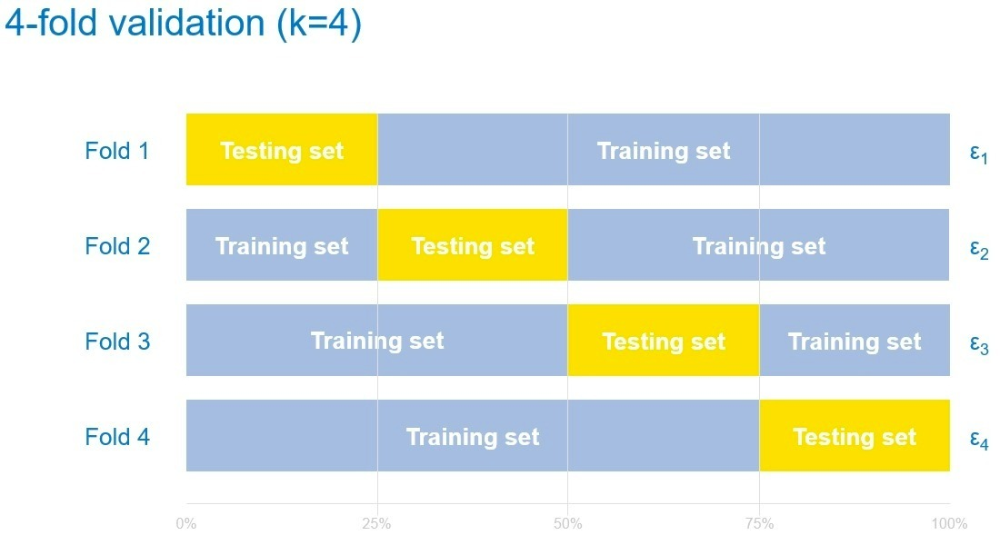

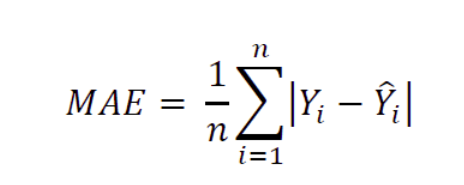
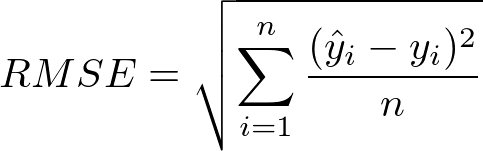

მინიმალურ და მაქსიმალუქ ქულად გადავწყვიტეთ აგვეღო 0 და 5, რადგან ამას არსებითი მნიშვნელობა არ აქვს. 

In [78]:
# შეფასების მეტრიკების დათვლის ფუნქცია
# არგუმენტები:
# cv=5(რამდენ ნაწილად დაყოს მონაცემები) 5 fold cross validation ანუ 20%-ებად დაყოფს
def evaluate_reccomendations(scoresdf, minscore, maxscore):
    reader = Reader(rating_scale=(minscore, maxscore))
    data = Dataset.load_from_df(scoresdf[['user', 'meal', 'score']], reader)
    algo = SVD() # ვირჩევთ ალგორითმს
    return cross_validate(algo, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

In [79]:
# უშვებს თრეინინგს მთლიან მონაცემებზე და გვაძლევს prediction-ებს ყველა არ არსებულ ქულაზე
def get_predictions(scoresdf, minscore, maxscore):
    reader = Reader(rating_scale=(minscore, maxscore))
    data = Dataset.load_from_df(scoresdf[['user', 'meal', 'score']], reader)
    
    trainset = data.build_full_trainset()
    algo = SVD()
    algo.fit(trainset)
    
    testset = trainset.build_anti_testset()
    return algo.test(testset)

In [80]:
# prediction ებიდან მხოლოდ ტოპ n-ცალს ტოვებს. 
def get_top_n(predictions, n=10):
    
    # ყველა იუზერისთვის ყველა გამოცნობილი შეფასება ერთად შევკრიბოთ
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))
        
     # დავასორტიროთ და ტოპ n ცალი დავტოვოთ
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

---

In [86]:
scoreslist = finalScores.copy()

In [87]:
scoreslist.describe()

,user,score
count,858486.000000,858486.000000
mean,4930.220791,0.062141
std,2832.124703,0.120419
min,1.000000,0.000005
25%,2510.000000,0.008595
50%,4919.000000,0.022743
75%,7379.000000,0.062238
max,9897.000000,7.076024


როგორც ვხედავთ მაქსიმუმი არის 7 ხოლო საშუალო კი 0.06 რასაც ვეცდებით რომ ქულებზ tanh ის მოდებით გავასწოროთ. 

In [88]:
scoreslist.sort_values(by=['score'])[-15:]

,user,meal,score
35315,422,almond milk,4.332621
1869,28,coffee,4.506250
818832,9415,tomatoes,4.544323
761902,8729,banana,5.000000
761906,8729,cream,5.000000
761905,8729,trail mix,5.000000
568420,6482,mcdonald's,5.000000
761903,8729,almond butter,5.000000
761904,8729,chicken,5.000000
735596,8435,lemon juice,5.016575


ჩანს და ლოგიკურია რომ მაღალი ქულები ყოველდღიურ საჭმელებს აქვთ.

In [89]:
(5*np.tanh(scoreslist['score']/0.05)).describe()

count    858486.000000
mean          2.459814
std           1.713935
min           0.000455
25%           0.851162
50%           2.129443
75%           4.234041
max           5.000000
Name: score, dtype: float64

tanh მინიმუმს და მაქსიმუმს 0-ად და 1-ად გახდის ხოლო ჩვენ 5-ზე ვამრავლებთ რომ ჩვენთვის სასურველი ქულები მივიღოთ. 
0.05 ავარჩიეთ ისე რომ ქულების საშულო ქულა დაახლოებით 2.5 ყოფილიყო

In [90]:
scoreslist['score'] = (5*np.tanh(scoreslist['score']/0.05))

In [91]:
scoreslist

,user,meal,score
0,1,muffin,0.907353
1,1,biscuits,4.998959
2,1,milk,4.999939
3,1,cookies,4.923703
4,1,pie,1.080374
...,...,...,...
858481,9897,milk,0.815332
858482,9897,ham,1.572126
858483,9897,butter,0.541604
858484,9897,soup,0.541604


## გავუშვათ!

In [92]:
evaluate_reccomendations(scoreslist, 0, 5)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.3369  1.3395  1.3395  1.3395  1.3399  1.3390  0.0011  
MAE (testset)     1.0636  1.0676  1.0667  1.0662  1.0668  1.0662  0.0014  
Fit time          36.92   37.38   37.85   38.10   38.26   37.70   0.49    
Test time         1.24    1.27    1.33    1.34    1.34    1.31    0.04    


{'test_rmse': array([1.33685113, 1.33945226, 1.3394654 , 1.33949539, 1.33993962]),
 'test_mae': array([1.06356343, 1.06757535, 1.06674542, 1.06618883, 1.06675495]),
 'fit_time': (36.9187490940094,
  37.37531042098999,
  37.84661841392517,
  38.104777097702026,
  38.26350545883179),
 'test_time': (1.2446908950805664,
  1.2692298889160156,
  1.3341429233551025,
  1.337451696395874,
  1.3440382480621338)}

როგორ ვხედავთ RMSE და MAE-ც დაახლოებით 1-ის ტოლია. ანუ საშუალოდ 1 ქულით ცდება ჩვენი რეკომენდაციის სისტემა. რაც კარგი შედეგია. 

## ავაგოთ prediction ები

In [93]:
predictions = get_predictions(scoreslist, 0, 5)

In [94]:
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
top_n = get_top_n(predictions, n=10)

In [95]:
top_n

defaultdict(list,
            {1: [('vitamins', 3.5784757869183483),
              ('almond butter', 3.3276886273115522),
              ('evening primrose', 3.2772473740346912),
              ('vanilla', 3.2124087083494333),
              ('quaker oats', 2.93052688579471),
              ('fish oil', 2.908201394623558),
              ('yogurt', 2.7771140320000276),
              ('coconut oil', 2.7563588615618886),
              ('rose hips', 2.673280051716395),
              ('drink mix', 2.6717363728203676)],
             2: [('yogurt', 5),
              ('fish oil', 4.910245497687201),
              ('bananas', 4.597252821286851),
              ('crackers', 4.583296643782445),
              ('hummus', 4.572713228126334),
              ('salmon', 4.539903646106914),
              ('evening primrose', 4.528200309166115),
              ('black tea', 4.434667725967433),
              ('eggs', 4.3311977249383515),
              ('potato chips', 4.264753480243696)],
             3: [('lemo

In [96]:
def print_top_n(top_n):
    # დავბეჭდოთ რეკომენდირებული აითემები
    for uid, user_ratings in top_n.items():
        print(uid, [item for item in user_ratings])
        print()

In [97]:
print_top_n(top_n)

1 [('vitamins', 3.5784757869183483), ('almond butter', 3.3276886273115522), ('evening primrose', 3.2772473740346912), ('vanilla', 3.2124087083494333), ('quaker oats', 2.93052688579471), ('fish oil', 2.908201394623558), ('yogurt', 2.7771140320000276), ('coconut oil', 2.7563588615618886), ('rose hips', 2.673280051716395), ('drink mix', 2.6717363728203676)]

2 [('yogurt', 5), ('fish oil', 4.910245497687201), ('bananas', 4.597252821286851), ('crackers', 4.583296643782445), ('hummus', 4.572713228126334), ('salmon', 4.539903646106914), ('evening primrose', 4.528200309166115), ('black tea', 4.434667725967433), ('eggs', 4.3311977249383515), ('potato chips', 4.264753480243696)]

3 [('lemon', 5), ('bread', 5), ('beans', 5), ('sausage', 5), ('asparagus', 5), ('corn', 5), ('salad', 5), ('eggs', 5), ('pork', 5), ('broccoli', 5)]

4 [("mcdonald's", 4.517048212858342), ('gin', 4.375301576112723), ('mixed nuts', 4.211105918740664), ('ketchup', 4.107344041762681), ('hummus', 4.04149178788191), ('almond

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



როგორც ვხედავთ მივიღეთ ადეკვატური შეთავაზებები, თუმცა ვიფიქრეთ რომ რეკომენდაციამ ზედმეტად ყოველდღიური საჭმელები შესთავაზა მომხმარებლებს როგორიც არის მაგალითად ზეთი, რძე, პური, კვერცხი, ჩაი, ყავა და ა.შ.. ცოტა უფრო საინტერესო და განსხვავებული შეთავაზებების მისაღებად გადავწყვიტეთ რომ საჭმელების სიიდან ხელით ამოგვეღო ყველაზე ხშირად შეხვედრილი 10% საჭმელების და ისე გაგვეშვა რეკომენდაციები. 

In [98]:
finalFood[:20]

['chicken',
 'chocolate',
 'coffee',
 'cheese',
 'milk',
 'peanut butter',
 'vanilla',
 'eggs',
 'egg',
 'banana',
 'yogurt',
 'bread',
 'butter',
 'rice',
 'sugar',
 'spinach',
 'strawberry',
 'salad',
 'cream',
 'almond milk']

In [99]:
notSoCommonFood = finalFood[110:] # copy

ასევე ხელით ამოვაგდოთ რამდენიმე საჭმელი რომელიც დაკვირდების შედეგად მივხვდით რომ ასევე ყოველდღიურია და რეკომენდაციად არ გამოდგება.

In [100]:
notSoCommonFood.remove('evening primrose')
notSoCommonFood.remove('borage')
# notSoCommonFood.remove('fish oil')

In [101]:
new_rec_data = parseFoodNames(datajsoned, notSoCommonFood)

In [102]:
new_scores = calculateScores(new_rec_data)

In [103]:
new_scores['score'] = (5*np.tanh(new_scores['score']/0.05))

In [104]:
new_scores.describe()

,user,score
count,539498.000000,539498.000000
mean,4930.382965,2.160885
std,2829.224249,1.657926
min,1.000000,0.001175
25%,2517.000000,0.687318
50%,4919.000000,1.663294
75%,7376.000000,3.634452
max,9897.000000,5.000000


In [105]:
predictions = get_predictions(new_scores, 0, 5)

In [106]:
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
top_n = get_top_n(predictions, n=10)

In [107]:
print_top_n(top_n)

1 [('soy milk', 3.426255516950783), ('shake', 3.163301904642996), ('casein', 2.8519088680710585), ('almond', 2.8425186299004204), ('cracker', 2.6808452468056854), ('quaker oats', 2.657154665109844), ('canola oil', 2.6167472239328995), ('almond butter', 2.5708371719305547), ('whey', 2.5700155300836474), ('rose hips', 2.5394259515833095)]

2 [('mushroom', 4.563598135089508), ('whey', 4.2161113322956405), ('almond', 4.108242601449756), ('hazelnut', 3.8637567756401254), ('rose hips', 3.7664840605986862), ('walnuts', 3.728195775992356), ('casein', 3.67899548182075), ('cracker', 3.643306443387252), ('chia', 3.639728991637739), ('flaxseed', 3.6169775746765263)]

3 [('white bread', 5), ('bean', 5), ('sage', 5), ('fish', 5), ('vinaigrette', 5), ('peas', 5), ('whey', 5), ('granola', 5), ('tuna', 5), ('english', 5)]

4 [('bean', 4.827093818230328), ('meat', 4.626979063798112), ('almond', 4.289722622246813), ('tofu', 4.276842276903309), ('granola', 4.038673082486502), ('tortilla chips', 3.98416588

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ამ ალგორითმის შედეგად მივიღეთ განსხვავებული და საკმაოდ საინტერესო შედეგები. მართალია ქულები ჩვენივე დაწერილი იყო მაგრამ ამ ქულებში რეკომენდაციის სისტემა საშუალოთ 1 ქულით ცდებოდა. მონაცემები საკმაოდ რთული დასამუშავებელი იყო თუმცა სხვასხვა ხერხების გამოყენებით მოვახერხეთ და ყველა საჭმელს შევუსაბამეთ თავისი ქულა.

## რეკომენდაცია მიზნის მიხედვით

ამ შემთხვევაში ქულის დათვლის მეთოდში შევცვალეთ მიზანთან დაკავშირებული კოეფიციენტი რომელიც აქამდე დიდ წონას აძლევდა მიზნის გადაჭარბებას. ამჯერად კი ჩვენ პირიქით, დავაჯილოვეთ goal-ის კარგად შესრულება: 
1. cosine distance-ით ვითვლთ რამდენად მსგავსია goal და total ვექტორები.
2. ვითვლით განსხვავებას total და goal ვექტორის თითოეულ წევრს შორის `min(total/goal, goal/total)` ფორმულით და ვითვლით მიღებული რიცხვების საშუალოს. 

ამით ვსჯით მიზნისგან გადახრას.

გავფილტროთ ყველა ისეთი სტრიქონი სადაც goal ან total ცარიელია. 

In [108]:
rec_data = rec_data[rec_data.Summary.apply(lambda x: len(x['total'])) != 0]
rec_data = rec_data[rec_data.Summary.apply(lambda x: len(x['goal'])) != 0]

In [111]:
from scipy.spatial import distance


In [112]:
def intersection(lst1, lst2): 
    lst3 = [value for value in lst1 if value in lst2] 
    return lst3 
def caloriesCoef(summary): # ეს ფუნქცია დაoverrideება
    k1 = []
    k2 = []
    m1 = {}
    m2 = {}
    for i in range(len(summary['goal'])): 
        if summary['goal'][i]['value'] == 0: #0-ზე გაყოფას თავს ვარიდებთ.
            summary['goal'][i]['value'] = 1
        k1.append(summary['goal'][i]['name'])
        m1[summary['goal'][i]['name']] = i
            
    for i in range(len(summary['total'])): 
        if summary['total'][i]['value'] == 0: #0-ზე გაყოფას თავს ვარიდებთ.
            summary['total'][i]['value'] = 1
        k2.append(summary['total'][i]['name'])
        m2[summary['total'][i]['name']] = i
        
    keys = intersection(k1, k2)
    if len(keys) == 0:
        return 0
    v1 = [summary['goal'][m1[k]]['value'] for k in keys]
    v2 = [summary['total'][m2[k]]['value'] for k in keys]
    div = [np.minimum(t/g, g/t) for t,g in zip(v1, v2)]
    return (1 - distance.cosine(v1, v2))*np.mean(div)

In [122]:
health_scores = calculateScores(new_rec_data)

In [129]:
(5*np.tanh(health_scores['score']/0.008)).describe()

count    5.394980e+05
mean     2.519965e+00
std      1.886776e+00
min      9.993054e-08
25%      6.248672e-01
50%      2.306428e+00
75%      4.657600e+00
max      5.000000e+00
Name: score, dtype: float64

In [130]:
health_scores['score'] = (5*np.tanh(health_scores['score']/0.03))

In [131]:
evaluate_reccomendations(health_scores, 0, 5)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.1439  1.1462  1.1528  1.1502  1.1480  1.1482  0.0031  
MAE (testset)     0.8459  0.8460  0.8497  0.8496  0.8473  0.8477  0.0017  
Fit time          24.08   24.28   24.34   24.32   24.32   24.27   0.09    
Test time         0.82    0.80    0.80    0.81    0.80    0.81    0.01    


{'test_rmse': array([1.14390365, 1.14620423, 1.15283434, 1.15018118, 1.14804368]),
 'test_mae': array([0.84589489, 0.84602882, 0.84965169, 0.84962435, 0.84730418]),
 'fit_time': (24.08347225189209,
  24.28224515914917,
  24.335936069488525,
  24.318903923034668,
  24.317508935928345),
 'test_time': (0.8217856884002686,
  0.7983689308166504,
  0.8039875030517578,
  0.8081538677215576,
  0.8044781684875488)}

როგორც ვხედავთ, ამ დროსაც გამოცნობილი ქულები დაახლოებით 0.8-ით სცდება ორიგინალს. 

In [132]:
predictions = get_predictions(health_scores, 0, 5)

In [133]:
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
top_n = get_top_n(predictions, n=10)

In [134]:
print_top_n(top_n)

1 [('whey', 2.9323383185343186), ('gelatin', 2.1032601845288896), ('almond', 2.0857846522984476), ('casein', 2.0171234795891912), ('green smoothie', 1.8675129696777018), ('smoothie', 1.7859410725040652), ('cherry tomato', 1.707002877351711), ('elk', 1.7068648581599983), ('quinoa', 1.6928323040109077), ('hormel', 1.6835617767159419)]

2 [('cocoa', 3.2830128763522466), ('eel', 3.1974433612472137), ('tofu', 3.149115294830835), ('form', 3.1440175012915192), ('soy milk', 3.071233404542345), ('mushroom', 3.057050678849581), ('hummus', 3.010001930594761), ('hazelnut', 2.976884973920019), ('soymilk', 2.9608785295576707), ('chia seeds', 2.9202904078250174)]

3 [('white bread', 5), ('beer', 5), ('mate', 5), ('pasta', 5), ('grape', 5), ('whey', 5), ('eel', 5), ('sweetpotato', 5), ('kale', 5), ('tofu', 5)]

4 [('casein', 3.243383030145097), ('bean', 3.0398079751132765), ('almond', 2.835925868759009), ('beer', 2.672524995247614), ('clementine', 2.618769948353844), ('sugars', 2.525229343231489), ('o

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



დაკვირვებით ჩანს, რომ ახალი რეკომენდაციები წინა რეკომენდაციებს ჰგავს, თუმცა არაჯანმრთელი საჭმელები პირველ ათეულში აღარ გვხვდება. ის მივიღეთ რაც გვსურდა.

## დასკვნა:

ჩვენ შევქმენით ორი რეკომენდაციის სისტემა. აქედან პირველი მთლიანად გემოვნების მიხედვით აჯილდოებს საჭმელებს, ახალისებს კალორიების გადაცდენას. ხოლო მეორე, გემოვნების მიხედვით საჭმლის არჩევასთან ერთად, აჯილდოებს ადამიანის ნუტრიციული მიზნების შესრულებას, შესაბამასიდან ხელს უწყობს ჯანსაღ კვებას. ის, თუ რომელ რეკომენდაციას აირჩევთ, უკვე თქვენზეა დამოკიდებული. ;>

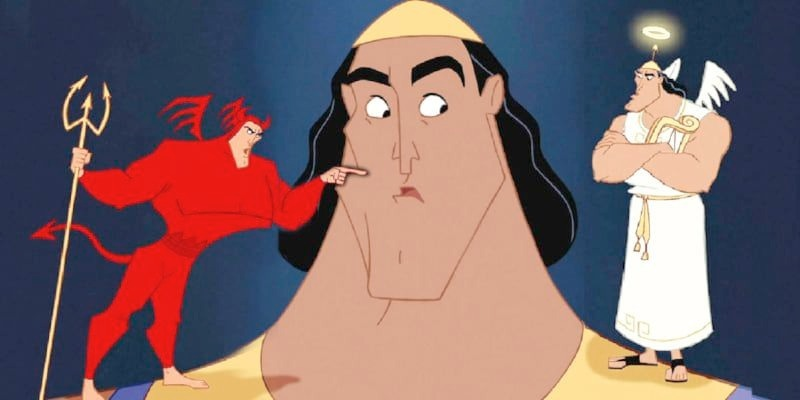